# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

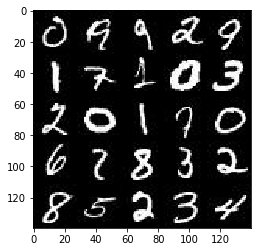

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

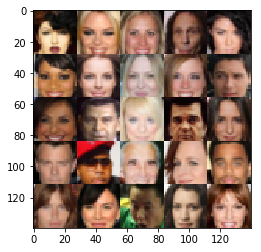

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real_inputs = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels),name = 'real_inputs')
    z_inputs = tf.placeholder(tf.float32, (None, z_dim), name = 'z_inputs')
    learning_rate = tf.placeholder(tf.float32, None, name = 'learning_rate')

    return real_inputs, z_inputs, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the generator, tensor logits of the generator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator',reuse = reuse):
        alpha = 0.01
        #28x28x3
        x1 = tf.layers.conv2d(images, 128, 3, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        #14x14x
        x2 = tf.layers.conv2d(relu1, 256, 3, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        relu2 = tf.nn.dropout(relu2, 0.8)
        #7x7x
        
        flat = tf.reshape(relu2, (-1, 7*7*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)

    return logits, out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator', reuse = not is_train):
        alpha = 0.1
        x1 = tf.layers.dense(z, 7*7*1024)
        
        x1 = tf.reshape(x1, (-1, 7, 7, 1024))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        
        x2 = tf.layers.conv2d_transpose(x1, 512, 3, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        
        x3 = tf.layers.conv2d_transpose(x2, 256, 3, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        
        #x4 = tf.layers.conv2d_transpose(x3, 128, 3, strides=2, padding='same')
        #x4 = tf.layers.batch_normalization(x4, training=is_train)
        #x4 = tf.maximum(alpha * x4, x4)
        
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 3, strides=1, padding='same')
        out = tf.tanh(logits)
    
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim, is_train=True)
    d_real_logits, d_real_out = discriminator(input_real, reuse=False)
    d_fake_logits, d_fake_out = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_real_logits, labels=tf.ones_like(d_real_out)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_fake_logits, labels=tf.zeros_like(d_fake_out)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_fake_logits, labels=tf.ones_like(d_fake_out)))
    
    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    real_inputs, z_inputs, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(real_inputs, z_inputs, data_shape[3])
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, lr, beta1)
    steps = 0
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps += 1
                # TODO: Train Model
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                batch_images = batch_images*2
                # Run optimizers
                _ = sess.run(d_train_opt, feed_dict={real_inputs: batch_images, z_inputs: batch_z, lr:learning_rate})
                _ = sess.run(g_train_opt, feed_dict={real_inputs: batch_images, z_inputs: batch_z, lr:learning_rate})
                
                if steps % 100 == 0:
                    show_generator_output(sess, 16, z_inputs, data_shape[3], data_image_mode)
                    train_loss_d = d_loss.eval({z_inputs: batch_z, real_inputs: batch_images*2})
                    train_loss_g = g_loss.eval({z_inputs: batch_z})
                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

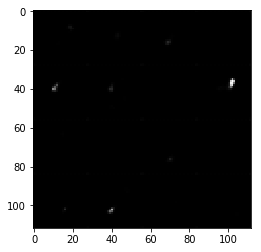

Epoch 1/2... Discriminator Loss: 1.8762... Generator Loss: 2.8474


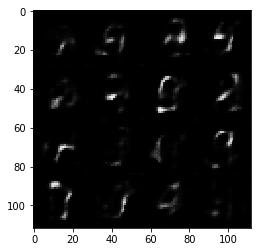

Epoch 1/2... Discriminator Loss: 1.4878... Generator Loss: 0.4276


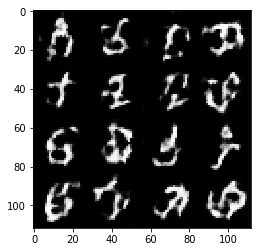

Epoch 1/2... Discriminator Loss: 1.2809... Generator Loss: 1.2228


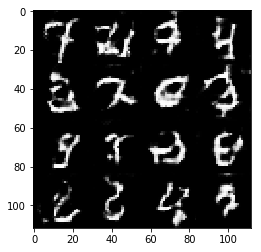

Epoch 1/2... Discriminator Loss: 1.2623... Generator Loss: 1.3281


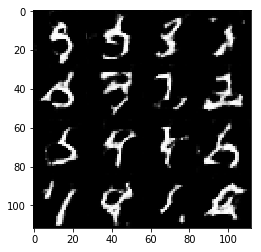

Epoch 1/2... Discriminator Loss: 2.4388... Generator Loss: 0.1341


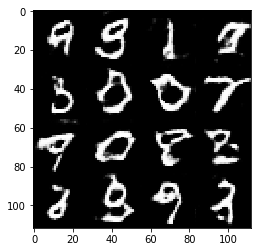

Epoch 1/2... Discriminator Loss: 1.3180... Generator Loss: 0.5138


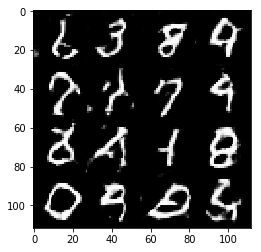

Epoch 1/2... Discriminator Loss: 1.3378... Generator Loss: 0.4931


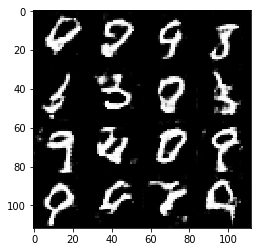

Epoch 1/2... Discriminator Loss: 1.4265... Generator Loss: 0.4569


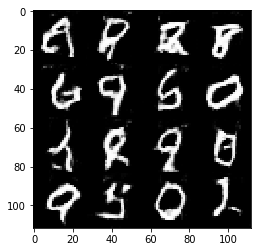

Epoch 1/2... Discriminator Loss: 1.3819... Generator Loss: 0.5151


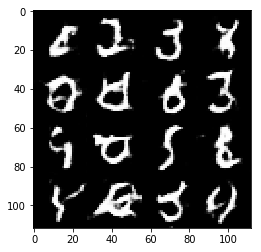

Epoch 1/2... Discriminator Loss: 2.7327... Generator Loss: 0.0937


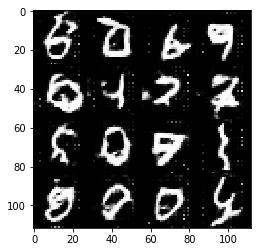

Epoch 1/2... Discriminator Loss: 2.5181... Generator Loss: 2.1778


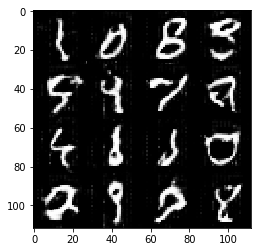

Epoch 1/2... Discriminator Loss: 1.4566... Generator Loss: 0.4850


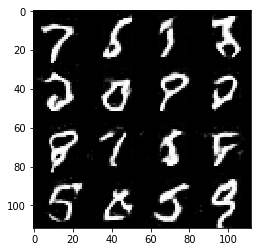

Epoch 1/2... Discriminator Loss: 1.4245... Generator Loss: 0.4356


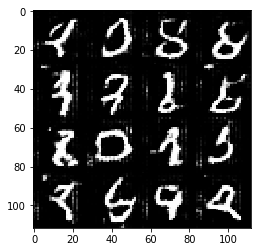

Epoch 1/2... Discriminator Loss: 4.1633... Generator Loss: 0.0428


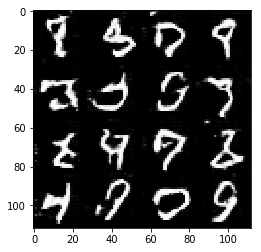

Epoch 1/2... Discriminator Loss: 1.0868... Generator Loss: 1.1142


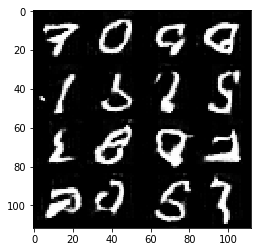

Epoch 1/2... Discriminator Loss: 1.4918... Generator Loss: 0.7916


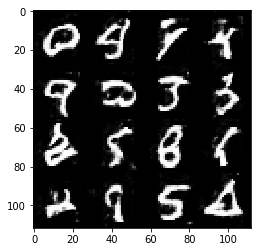

Epoch 1/2... Discriminator Loss: 0.9310... Generator Loss: 0.8113


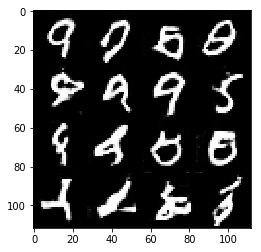

Epoch 1/2... Discriminator Loss: 1.0842... Generator Loss: 0.7703


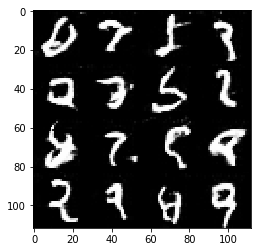

Epoch 2/2... Discriminator Loss: 0.8718... Generator Loss: 1.1814


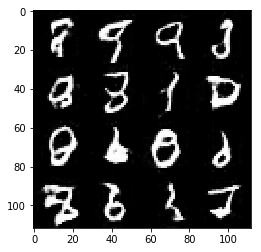

Epoch 2/2... Discriminator Loss: 0.7807... Generator Loss: 1.2079


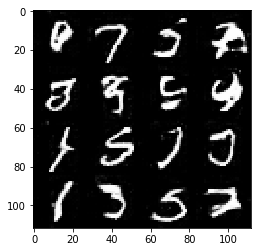

Epoch 2/2... Discriminator Loss: 0.9837... Generator Loss: 0.9261


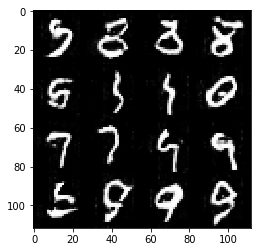

Epoch 2/2... Discriminator Loss: 1.1865... Generator Loss: 0.5694


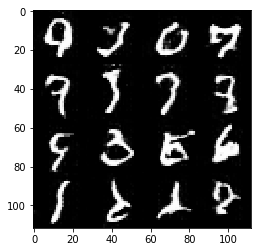

Epoch 2/2... Discriminator Loss: 1.5249... Generator Loss: 0.3054


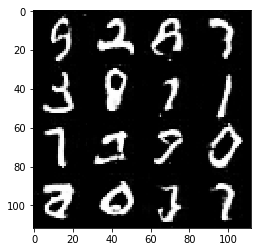

Epoch 2/2... Discriminator Loss: 1.0912... Generator Loss: 0.7545


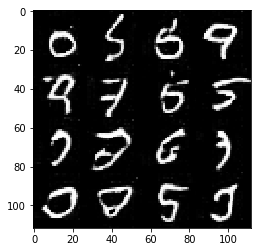

Epoch 2/2... Discriminator Loss: 1.4182... Generator Loss: 0.5539


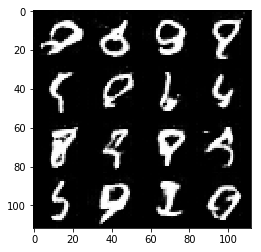

Epoch 2/2... Discriminator Loss: 1.2633... Generator Loss: 1.3356


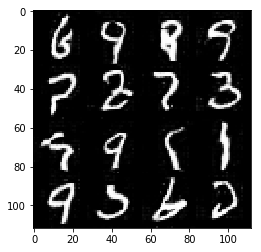

Epoch 2/2... Discriminator Loss: 2.0718... Generator Loss: 2.4535


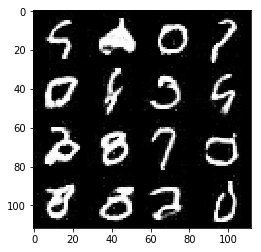

Epoch 2/2... Discriminator Loss: 1.0023... Generator Loss: 1.2490


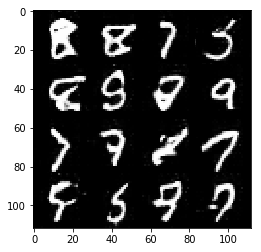

Epoch 2/2... Discriminator Loss: 1.1790... Generator Loss: 0.7085


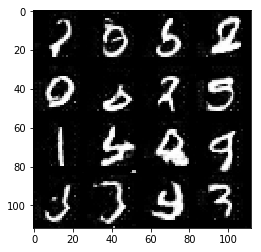

Epoch 2/2... Discriminator Loss: 1.2322... Generator Loss: 1.7242


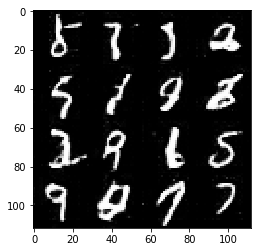

Epoch 2/2... Discriminator Loss: 0.8017... Generator Loss: 1.1420


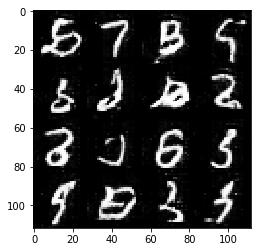

Epoch 2/2... Discriminator Loss: 0.4594... Generator Loss: 1.5998


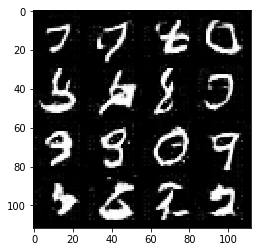

Epoch 2/2... Discriminator Loss: 0.6316... Generator Loss: 1.1878


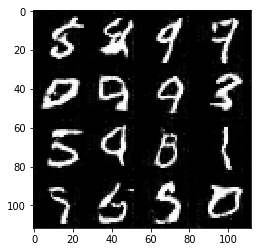

Epoch 2/2... Discriminator Loss: 0.6351... Generator Loss: 1.1834


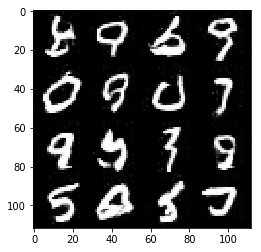

Epoch 2/2... Discriminator Loss: 0.7804... Generator Loss: 1.0507


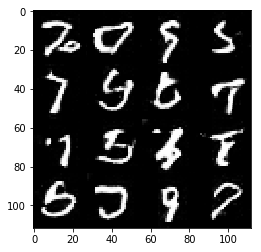

Epoch 2/2... Discriminator Loss: 1.2342... Generator Loss: 2.0836


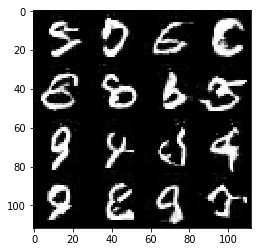

Epoch 2/2... Discriminator Loss: 0.8542... Generator Loss: 1.5664


In [ ]:
batch_size = 32
z_dim = 50
learning_rate = 0.001
beta1 = 0.1


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

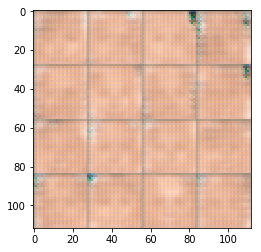

Epoch 1/5... Discriminator Loss: 1.7133... Generator Loss: 0.6955


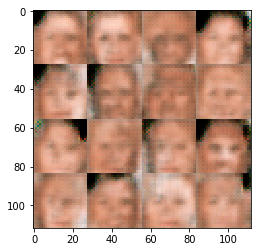

Epoch 1/5... Discriminator Loss: 2.3134... Generator Loss: 0.4980


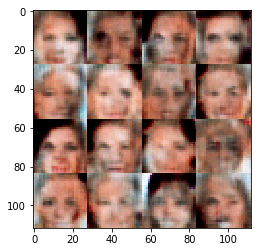

Epoch 1/5... Discriminator Loss: 2.6203... Generator Loss: 0.4258


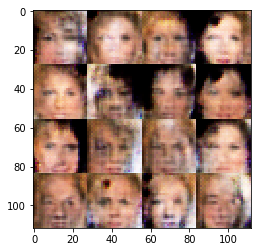

Epoch 1/5... Discriminator Loss: 3.7913... Generator Loss: 0.6966


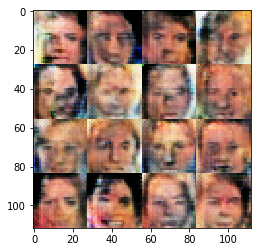

Epoch 1/5... Discriminator Loss: 2.5944... Generator Loss: 0.2276


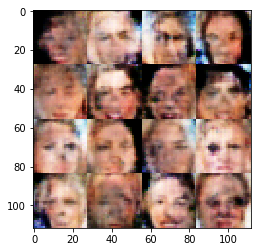

Epoch 1/5... Discriminator Loss: 5.1610... Generator Loss: 1.1980


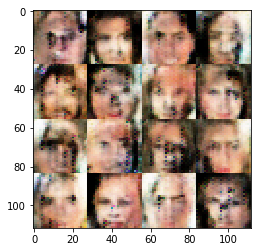

Epoch 1/5... Discriminator Loss: 3.7813... Generator Loss: 0.6703


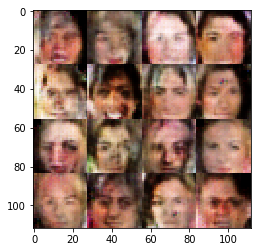

Epoch 1/5... Discriminator Loss: 3.7754... Generator Loss: 0.7208


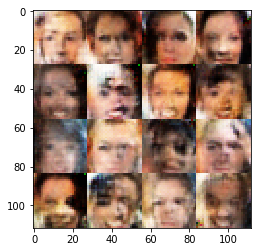

Epoch 1/5... Discriminator Loss: 4.2187... Generator Loss: 0.7546


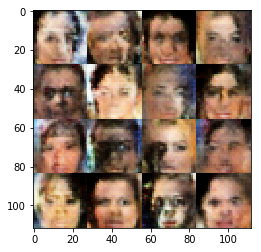

Epoch 1/5... Discriminator Loss: 2.4656... Generator Loss: 0.6705


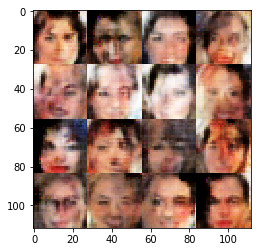

Epoch 1/5... Discriminator Loss: 3.7424... Generator Loss: 0.7866


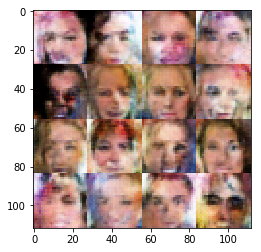

Epoch 1/5... Discriminator Loss: 2.6515... Generator Loss: 0.5477


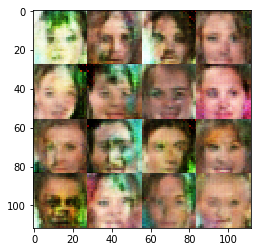

Epoch 1/5... Discriminator Loss: 3.4909... Generator Loss: 0.4085


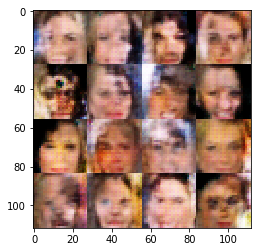

Epoch 1/5... Discriminator Loss: 2.8899... Generator Loss: 0.7638


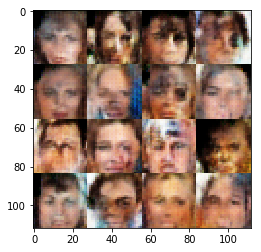

Epoch 1/5... Discriminator Loss: 2.5435... Generator Loss: 0.7335


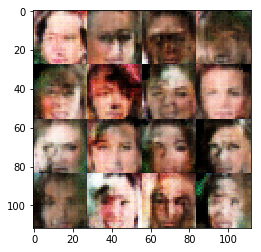

Epoch 1/5... Discriminator Loss: 2.5702... Generator Loss: 0.5116


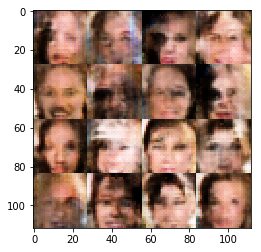

Epoch 1/5... Discriminator Loss: 2.8623... Generator Loss: 0.4809


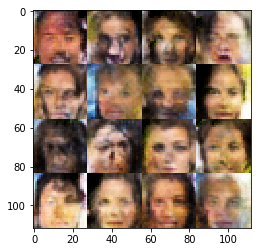

Epoch 1/5... Discriminator Loss: 1.7970... Generator Loss: 0.6096


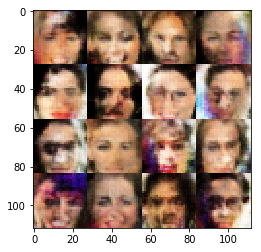

Epoch 1/5... Discriminator Loss: 1.4522... Generator Loss: 0.5446


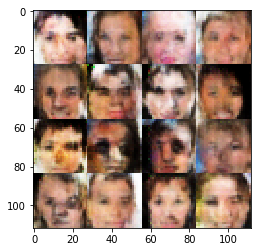

Epoch 1/5... Discriminator Loss: 1.8080... Generator Loss: 0.4774


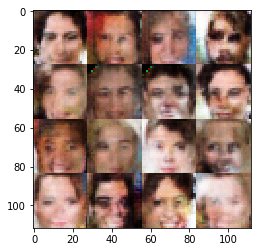

Epoch 1/5... Discriminator Loss: 2.1012... Generator Loss: 1.0214


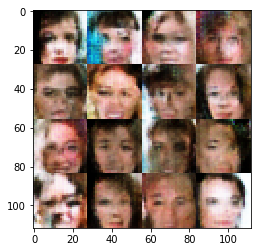

Epoch 1/5... Discriminator Loss: 2.2980... Generator Loss: 0.4984


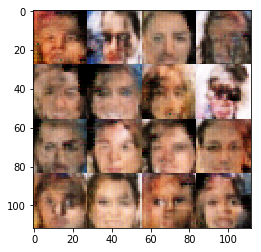

Epoch 1/5... Discriminator Loss: 1.4666... Generator Loss: 0.7154


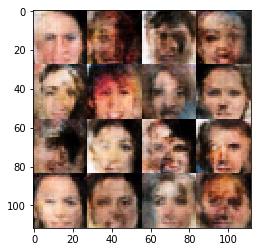

Epoch 1/5... Discriminator Loss: 2.1623... Generator Loss: 0.6684


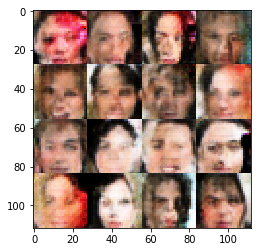

Epoch 1/5... Discriminator Loss: 1.6070... Generator Loss: 0.5998


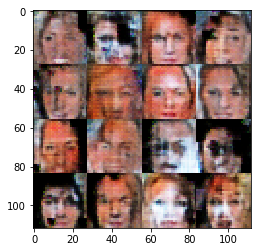

Epoch 1/5... Discriminator Loss: 1.3941... Generator Loss: 0.5883


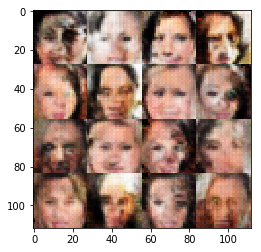

Epoch 1/5... Discriminator Loss: 2.1261... Generator Loss: 0.5506


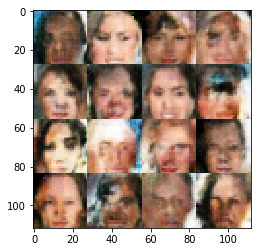

Epoch 1/5... Discriminator Loss: 2.2667... Generator Loss: 0.8683


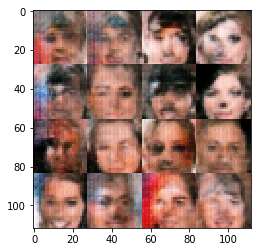

Epoch 1/5... Discriminator Loss: 3.2135... Generator Loss: 0.6049


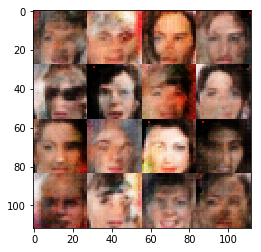

Epoch 1/5... Discriminator Loss: 3.3333... Generator Loss: 1.3941


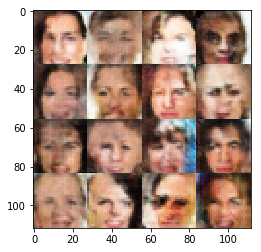

Epoch 1/5... Discriminator Loss: 3.5696... Generator Loss: 0.5854


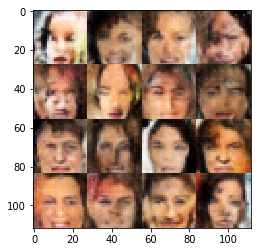

Epoch 1/5... Discriminator Loss: 3.6576... Generator Loss: 0.7324


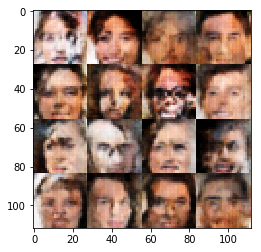

Epoch 1/5... Discriminator Loss: 3.4257... Generator Loss: 0.3174


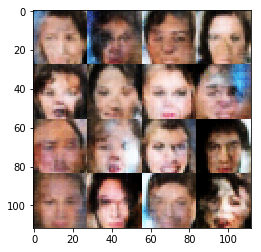

Epoch 1/5... Discriminator Loss: 2.9169... Generator Loss: 0.6076


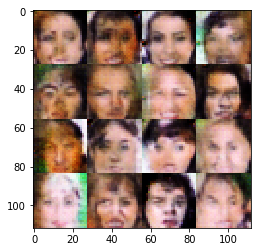

Epoch 1/5... Discriminator Loss: 3.7520... Generator Loss: 0.7569


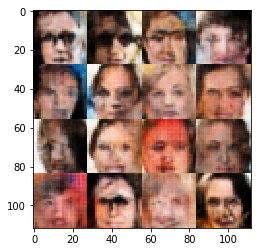

Epoch 1/5... Discriminator Loss: 3.9245... Generator Loss: 0.8694


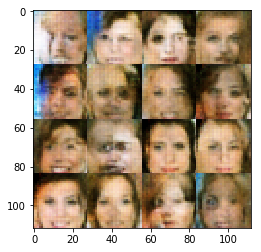

Epoch 1/5... Discriminator Loss: 2.5940... Generator Loss: 0.4176


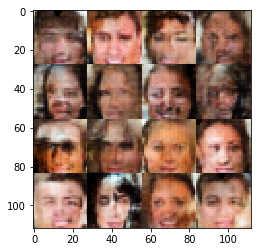

Epoch 1/5... Discriminator Loss: 3.5862... Generator Loss: 0.7658


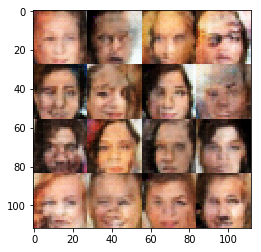

Epoch 1/5... Discriminator Loss: 3.6540... Generator Loss: 0.7231


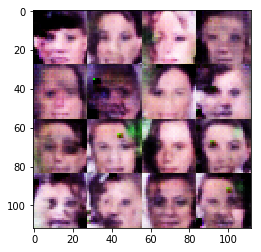

Epoch 1/5... Discriminator Loss: 6.6315... Generator Loss: 3.1489


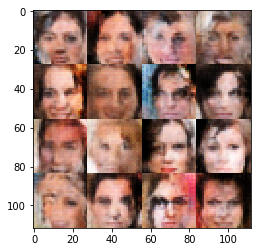

Epoch 1/5... Discriminator Loss: 2.6061... Generator Loss: 0.7208


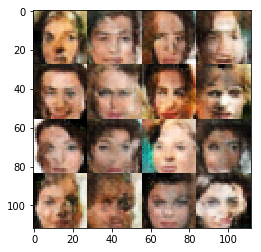

Epoch 1/5... Discriminator Loss: 3.4955... Generator Loss: 0.7419


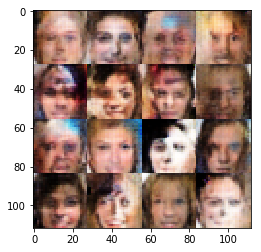

Epoch 1/5... Discriminator Loss: 3.8013... Generator Loss: 0.5966


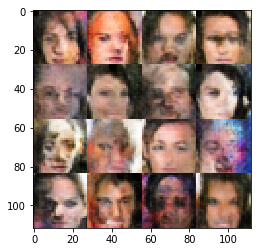

Epoch 1/5... Discriminator Loss: 3.2475... Generator Loss: 0.5439


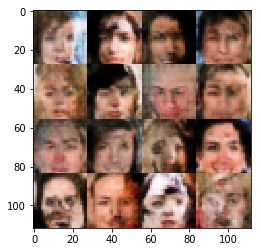

Epoch 1/5... Discriminator Loss: 2.0850... Generator Loss: 0.5385


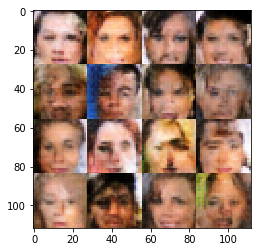

Epoch 1/5... Discriminator Loss: 2.5900... Generator Loss: 0.5833


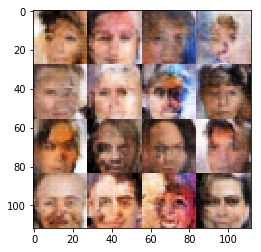

Epoch 1/5... Discriminator Loss: 2.0036... Generator Loss: 0.5677


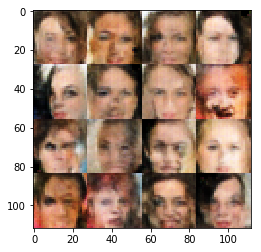

Epoch 1/5... Discriminator Loss: 2.8138... Generator Loss: 0.5004


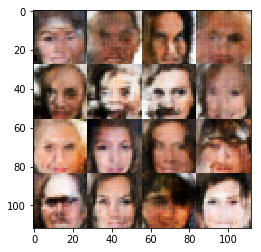

Epoch 1/5... Discriminator Loss: 1.4391... Generator Loss: 0.5534


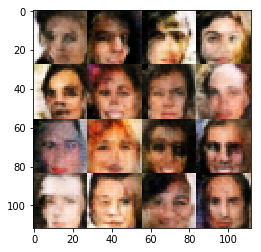

Epoch 1/5... Discriminator Loss: 3.0620... Generator Loss: 0.5953


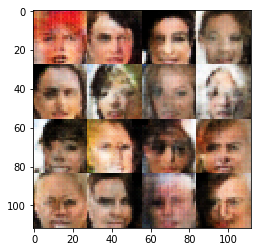

Epoch 1/5... Discriminator Loss: 3.1386... Generator Loss: 0.7954


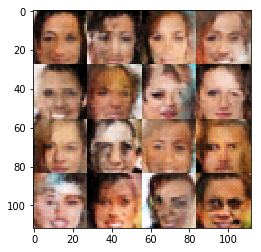

Epoch 1/5... Discriminator Loss: 1.5531... Generator Loss: 0.6323


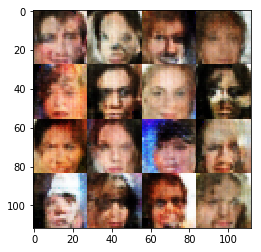

Epoch 1/5... Discriminator Loss: 2.0270... Generator Loss: 0.6235


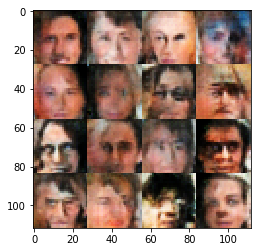

Epoch 1/5... Discriminator Loss: 1.6329... Generator Loss: 0.4976


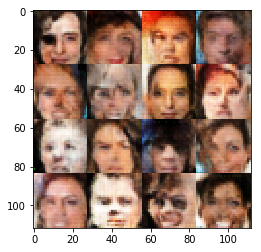

Epoch 1/5... Discriminator Loss: 2.1276... Generator Loss: 0.5797


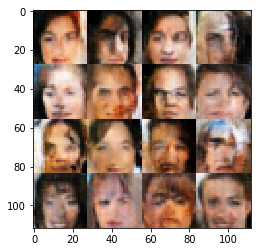

Epoch 1/5... Discriminator Loss: 2.4502... Generator Loss: 0.5921


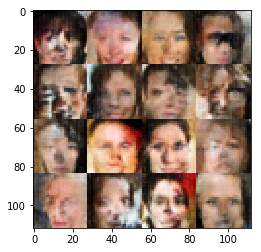

Epoch 1/5... Discriminator Loss: 2.5124... Generator Loss: 0.5177


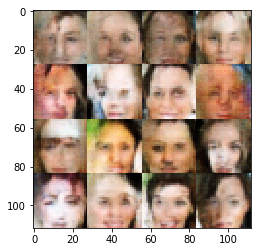

Epoch 1/5... Discriminator Loss: 2.1964... Generator Loss: 0.6245


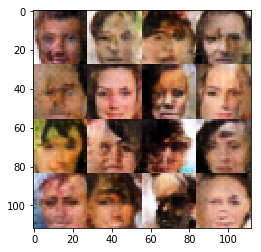

Epoch 1/5... Discriminator Loss: 1.9341... Generator Loss: 0.5153


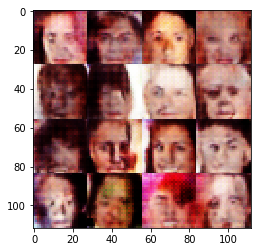

Epoch 1/5... Discriminator Loss: 5.5715... Generator Loss: 2.3170


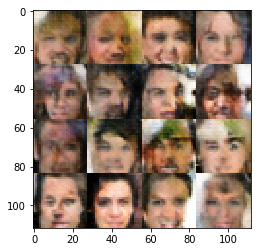

Epoch 1/5... Discriminator Loss: 2.8988... Generator Loss: 0.6325


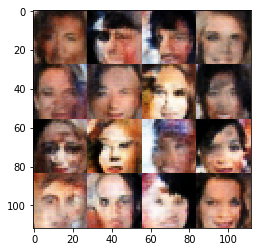

Epoch 1/5... Discriminator Loss: 2.4615... Generator Loss: 0.6425


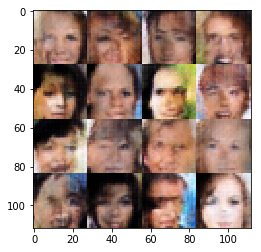

Epoch 1/5... Discriminator Loss: 2.5054... Generator Loss: 0.6461


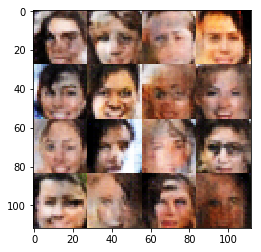

Epoch 2/5... Discriminator Loss: 2.4861... Generator Loss: 0.5161


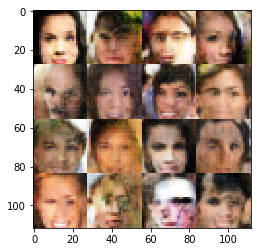

Epoch 2/5... Discriminator Loss: 2.2630... Generator Loss: 0.5171


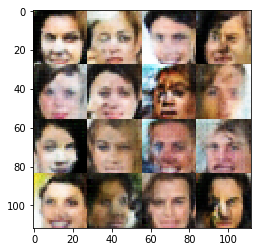

Epoch 2/5... Discriminator Loss: 2.0823... Generator Loss: 0.5928


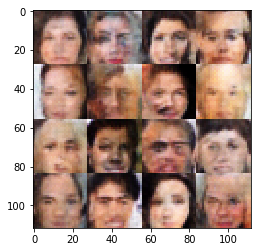

Epoch 2/5... Discriminator Loss: 1.6845... Generator Loss: 0.5953


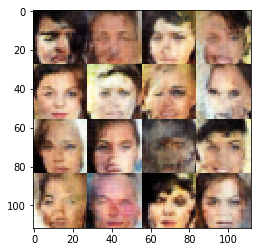

Epoch 2/5... Discriminator Loss: 2.6509... Generator Loss: 0.5660


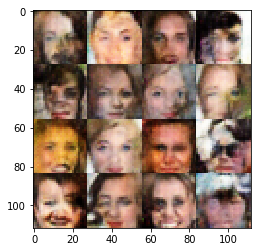

Epoch 2/5... Discriminator Loss: 1.7396... Generator Loss: 0.5263


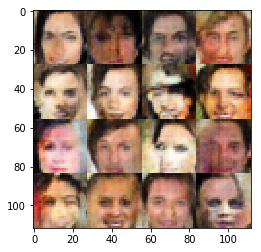

Epoch 2/5... Discriminator Loss: 2.6605... Generator Loss: 0.5749


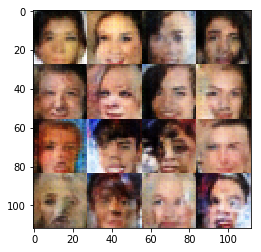

Epoch 2/5... Discriminator Loss: 1.8372... Generator Loss: 0.6081


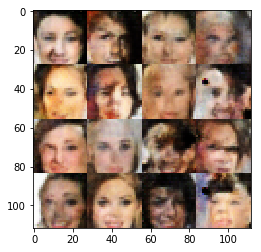

Epoch 2/5... Discriminator Loss: 2.1854... Generator Loss: 0.6195


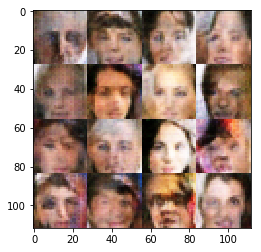

Epoch 2/5... Discriminator Loss: 1.9696... Generator Loss: 0.5648


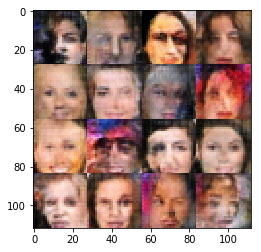

Epoch 2/5... Discriminator Loss: 1.9120... Generator Loss: 0.5081


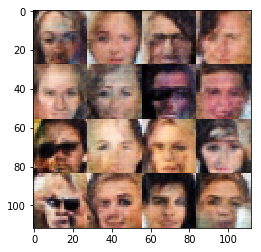

Epoch 2/5... Discriminator Loss: 1.7289... Generator Loss: 0.6370


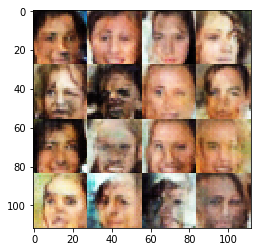

Epoch 2/5... Discriminator Loss: 1.5612... Generator Loss: 0.6117


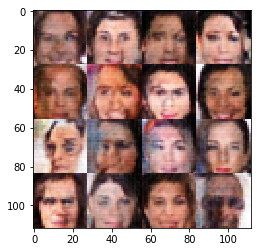

Epoch 2/5... Discriminator Loss: 1.9780... Generator Loss: 0.5406


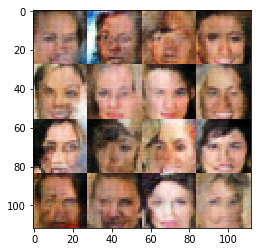

Epoch 2/5... Discriminator Loss: 1.5859... Generator Loss: 0.6096


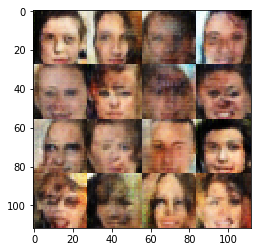

Epoch 2/5... Discriminator Loss: 1.9759... Generator Loss: 0.6356


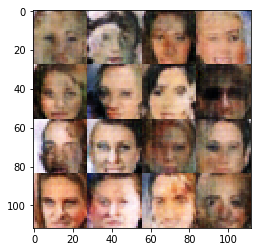

Epoch 2/5... Discriminator Loss: 1.9722... Generator Loss: 0.5605


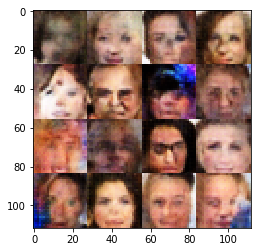

Epoch 2/5... Discriminator Loss: 2.0905... Generator Loss: 0.6205


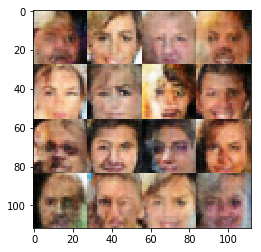

Epoch 2/5... Discriminator Loss: 1.7821... Generator Loss: 0.6412


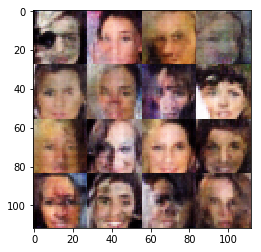

Epoch 2/5... Discriminator Loss: 1.9019... Generator Loss: 0.4734


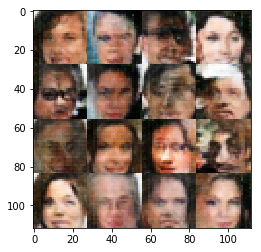

Epoch 2/5... Discriminator Loss: 1.7327... Generator Loss: 0.5983


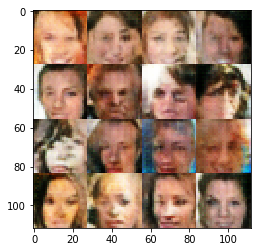

Epoch 2/5... Discriminator Loss: 1.7591... Generator Loss: 0.6445


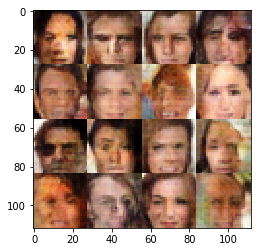

Epoch 2/5... Discriminator Loss: 1.7740... Generator Loss: 0.5439


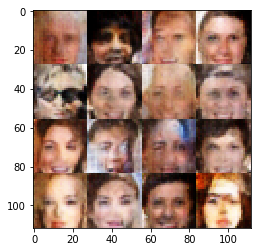

Epoch 2/5... Discriminator Loss: 1.8199... Generator Loss: 0.5347


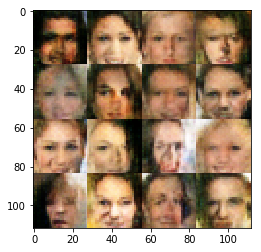

Epoch 2/5... Discriminator Loss: 1.6815... Generator Loss: 0.5278


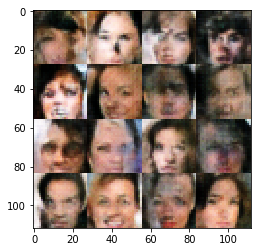

Epoch 2/5... Discriminator Loss: 1.5081... Generator Loss: 0.5854


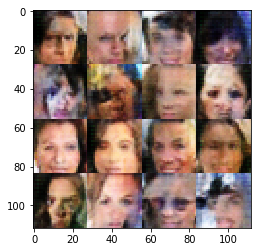

Epoch 2/5... Discriminator Loss: 1.4529... Generator Loss: 0.5477


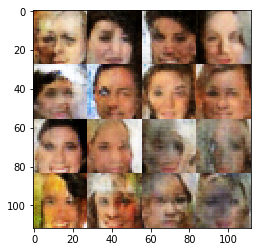

Epoch 2/5... Discriminator Loss: 1.6610... Generator Loss: 0.6324


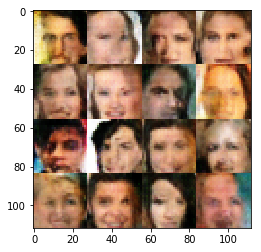

Epoch 2/5... Discriminator Loss: 1.4861... Generator Loss: 0.4724


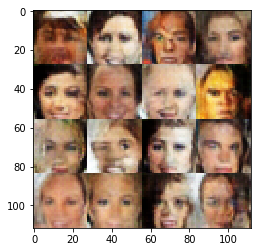

Epoch 2/5... Discriminator Loss: 1.3483... Generator Loss: 0.6260


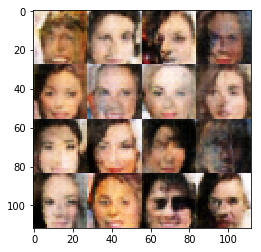

Epoch 2/5... Discriminator Loss: 1.9513... Generator Loss: 0.5560


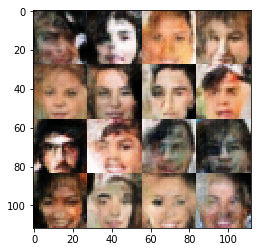

Epoch 2/5... Discriminator Loss: 1.4777... Generator Loss: 0.5243


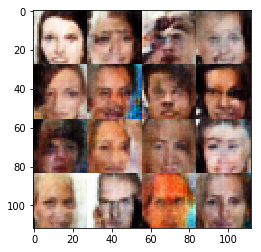

Epoch 2/5... Discriminator Loss: 1.4807... Generator Loss: 0.7769


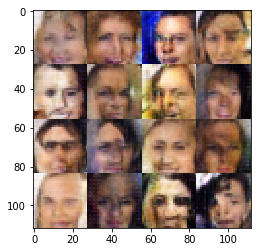

Epoch 2/5... Discriminator Loss: 1.6412... Generator Loss: 0.5318


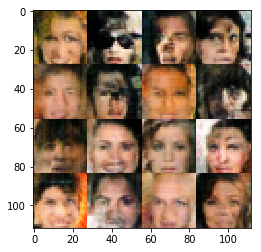

Epoch 2/5... Discriminator Loss: 1.7881... Generator Loss: 0.5625


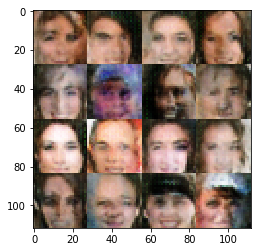

Epoch 2/5... Discriminator Loss: 1.9660... Generator Loss: 0.5455


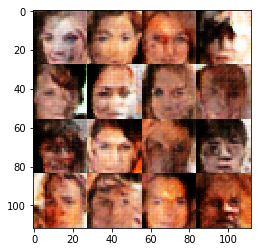

Epoch 2/5... Discriminator Loss: 3.0778... Generator Loss: 1.3860


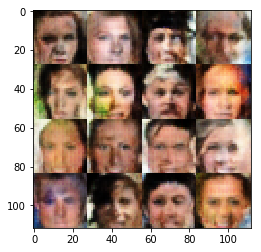

Epoch 2/5... Discriminator Loss: 1.2351... Generator Loss: 0.5932


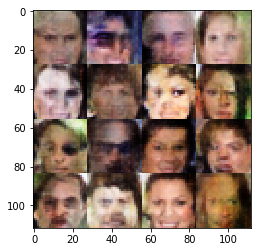

Epoch 2/5... Discriminator Loss: 1.7205... Generator Loss: 0.5087


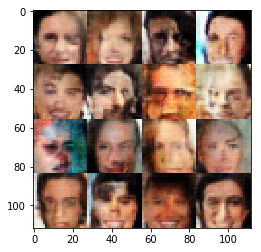

Epoch 2/5... Discriminator Loss: 1.6999... Generator Loss: 0.6420


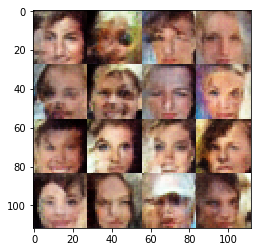

Epoch 2/5... Discriminator Loss: 1.5938... Generator Loss: 0.7086


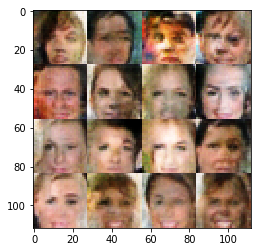

Epoch 2/5... Discriminator Loss: 1.6592... Generator Loss: 0.5821


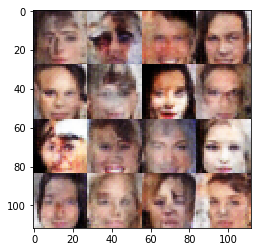

Epoch 2/5... Discriminator Loss: 1.8075... Generator Loss: 0.5216


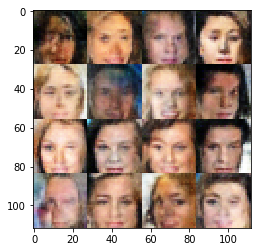

Epoch 2/5... Discriminator Loss: 1.5287... Generator Loss: 0.4608


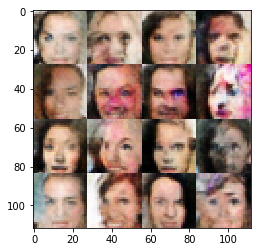

Epoch 2/5... Discriminator Loss: 1.4430... Generator Loss: 0.5745


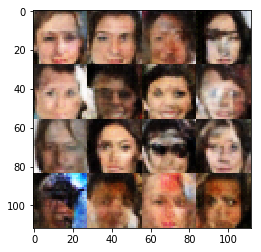

Epoch 2/5... Discriminator Loss: 1.8271... Generator Loss: 0.5739


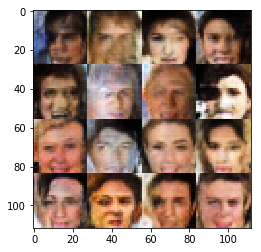

Epoch 2/5... Discriminator Loss: 1.6574... Generator Loss: 0.6151


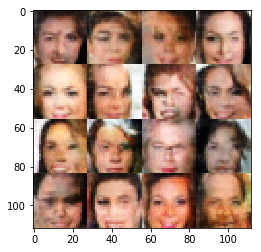

Epoch 2/5... Discriminator Loss: 1.4307... Generator Loss: 0.5515


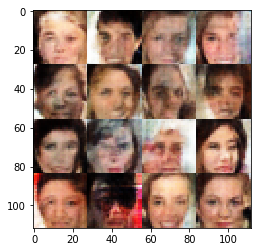

Epoch 2/5... Discriminator Loss: 1.6256... Generator Loss: 0.5536


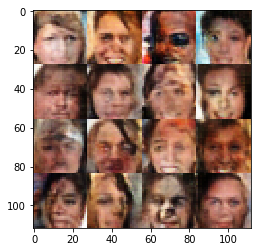

Epoch 2/5... Discriminator Loss: 1.5077... Generator Loss: 0.6824


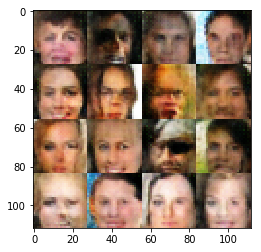

Epoch 2/5... Discriminator Loss: 1.5347... Generator Loss: 0.6268


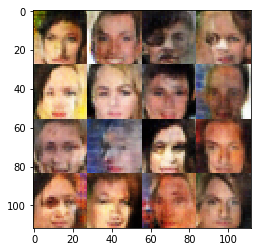

Epoch 2/5... Discriminator Loss: 1.8537... Generator Loss: 0.6485


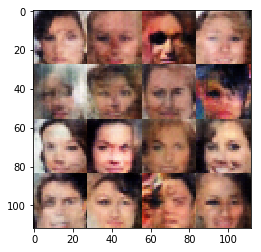

Epoch 2/5... Discriminator Loss: 1.5495... Generator Loss: 0.5505


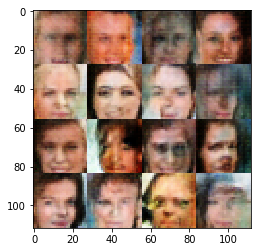

Epoch 2/5... Discriminator Loss: 1.5231... Generator Loss: 0.6163


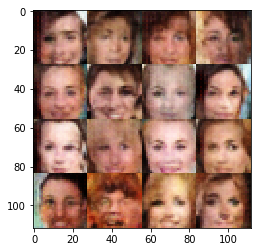

Epoch 2/5... Discriminator Loss: 1.6978... Generator Loss: 0.5743


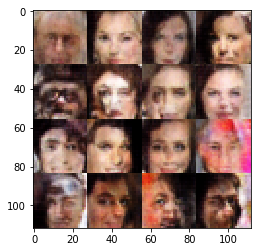

Epoch 2/5... Discriminator Loss: 1.8029... Generator Loss: 0.6510


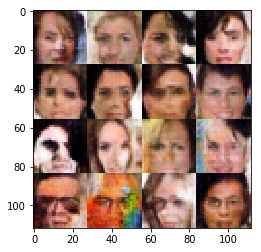

Epoch 2/5... Discriminator Loss: 1.7678... Generator Loss: 0.6102


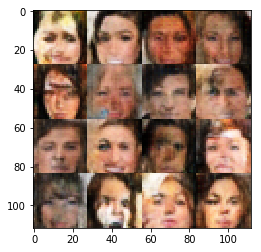

Epoch 2/5... Discriminator Loss: 1.5272... Generator Loss: 0.5704


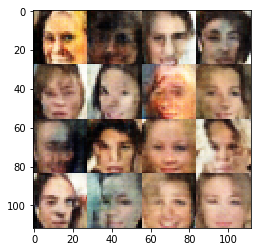

Epoch 2/5... Discriminator Loss: 1.9330... Generator Loss: 0.5292


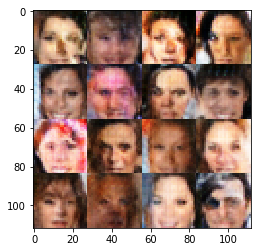

Epoch 2/5... Discriminator Loss: 1.8429... Generator Loss: 0.6039


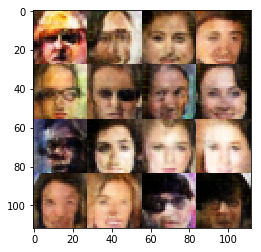

Epoch 2/5... Discriminator Loss: 1.6385... Generator Loss: 0.7232


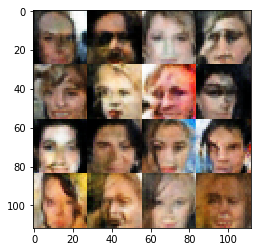

Epoch 2/5... Discriminator Loss: 1.8324... Generator Loss: 0.5968


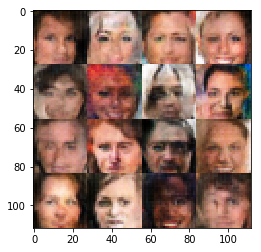

Epoch 2/5... Discriminator Loss: 1.7469... Generator Loss: 0.5949


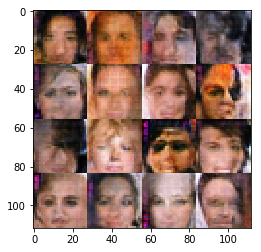

Epoch 3/5... Discriminator Loss: 1.6752... Generator Loss: 0.5761


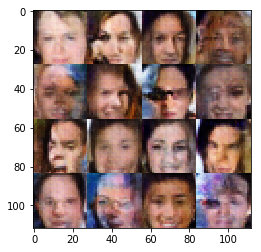

Epoch 3/5... Discriminator Loss: 1.6733... Generator Loss: 0.5455


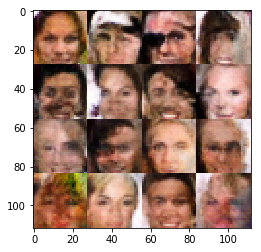

Epoch 3/5... Discriminator Loss: 1.5643... Generator Loss: 0.5539


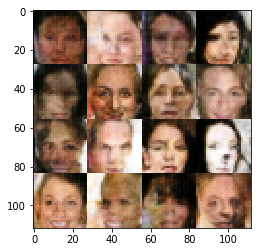

Epoch 3/5... Discriminator Loss: 1.5335... Generator Loss: 0.6208


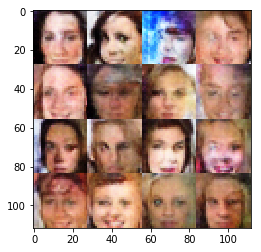

Epoch 3/5... Discriminator Loss: 1.5312... Generator Loss: 0.6055


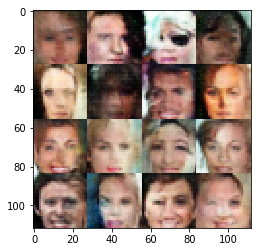

Epoch 3/5... Discriminator Loss: 1.4181... Generator Loss: 0.5977


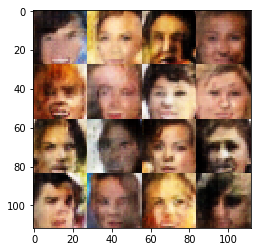

Epoch 3/5... Discriminator Loss: 1.8065... Generator Loss: 0.5970


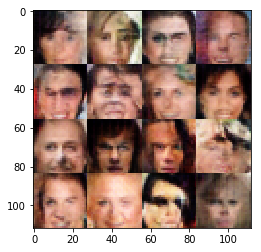

Epoch 3/5... Discriminator Loss: 1.5741... Generator Loss: 0.6626


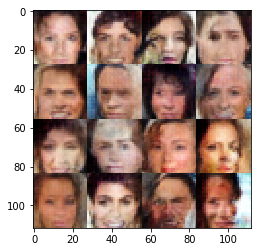

Epoch 3/5... Discriminator Loss: 2.1101... Generator Loss: 0.4892


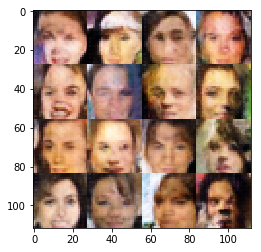

Epoch 3/5... Discriminator Loss: 1.5916... Generator Loss: 0.6670


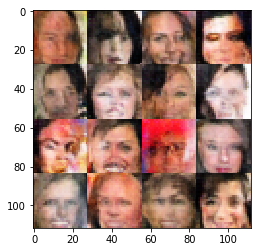

Epoch 3/5... Discriminator Loss: 1.6095... Generator Loss: 0.6534


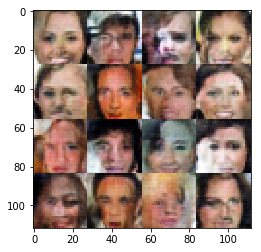

Epoch 3/5... Discriminator Loss: 1.5556... Generator Loss: 0.5984


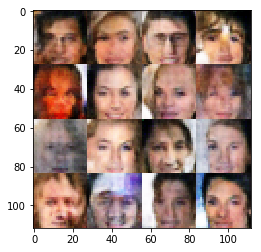

Epoch 3/5... Discriminator Loss: 1.3867... Generator Loss: 0.6893


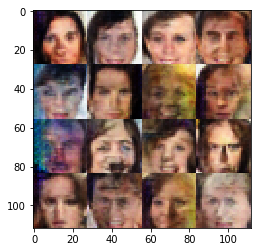

Epoch 3/5... Discriminator Loss: 1.6715... Generator Loss: 0.5394


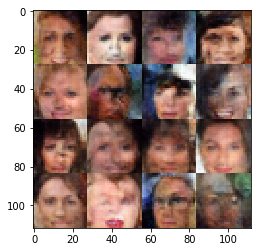

Epoch 3/5... Discriminator Loss: 1.7369... Generator Loss: 0.5784


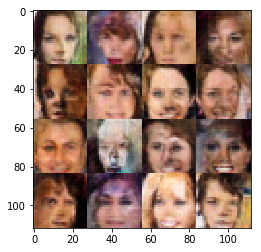

Epoch 3/5... Discriminator Loss: 1.5602... Generator Loss: 0.5044


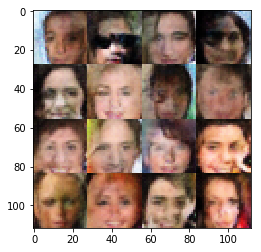

Epoch 3/5... Discriminator Loss: 1.7276... Generator Loss: 0.4894


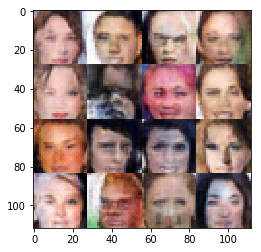

Epoch 3/5... Discriminator Loss: 1.4902... Generator Loss: 0.6305


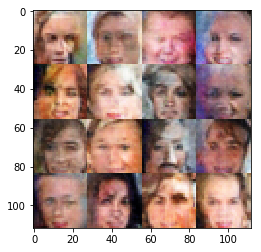

Epoch 3/5... Discriminator Loss: 1.6639... Generator Loss: 0.6172


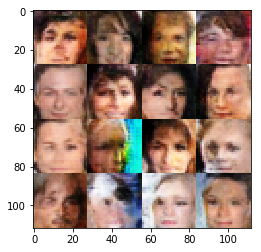

Epoch 3/5... Discriminator Loss: 1.6469... Generator Loss: 0.6021


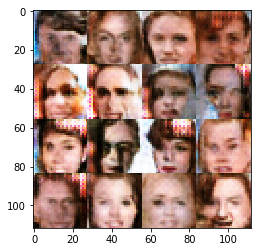

Epoch 3/5... Discriminator Loss: 1.8586... Generator Loss: 0.7626


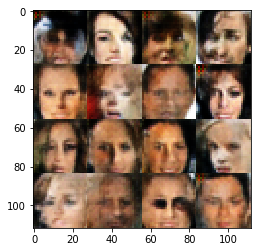

Epoch 3/5... Discriminator Loss: 1.9778... Generator Loss: 0.6625


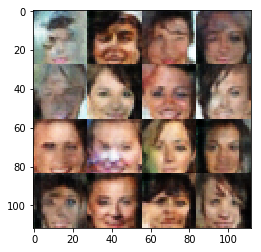

Epoch 3/5... Discriminator Loss: 1.5304... Generator Loss: 0.6645


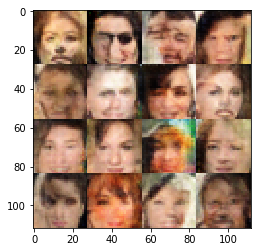

Epoch 3/5... Discriminator Loss: 1.7100... Generator Loss: 0.6907


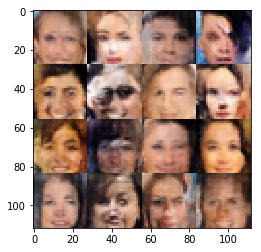

Epoch 3/5... Discriminator Loss: 1.5406... Generator Loss: 0.6002


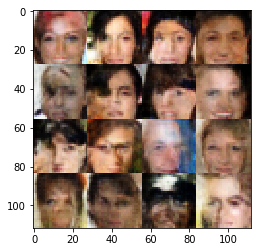

Epoch 3/5... Discriminator Loss: 1.6397... Generator Loss: 0.6204


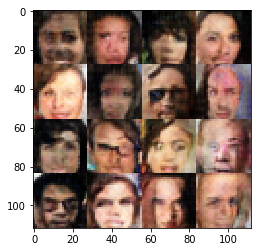

Epoch 3/5... Discriminator Loss: 1.6185... Generator Loss: 0.6053


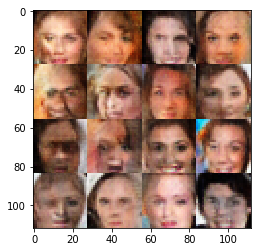

Epoch 3/5... Discriminator Loss: 1.6473... Generator Loss: 0.6051


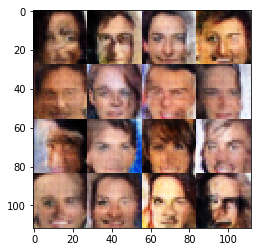

Epoch 3/5... Discriminator Loss: 1.5943... Generator Loss: 0.5242


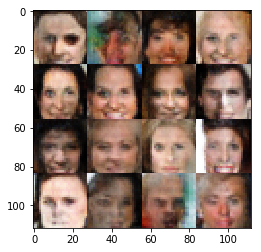

Epoch 3/5... Discriminator Loss: 1.5893... Generator Loss: 0.5563


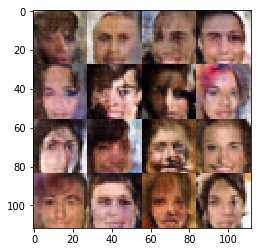

Epoch 3/5... Discriminator Loss: 1.5587... Generator Loss: 0.5845


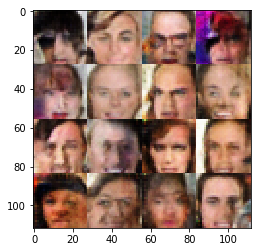

Epoch 3/5... Discriminator Loss: 1.6591... Generator Loss: 0.6266


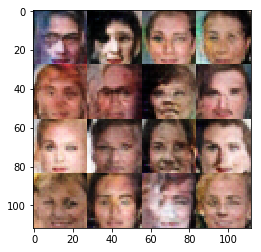

Epoch 3/5... Discriminator Loss: 1.6229... Generator Loss: 0.5581


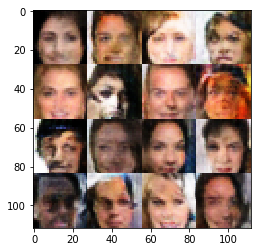

Epoch 3/5... Discriminator Loss: 1.4758... Generator Loss: 0.6610


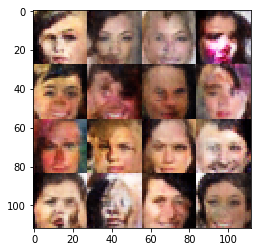

Epoch 3/5... Discriminator Loss: 1.4544... Generator Loss: 0.6462


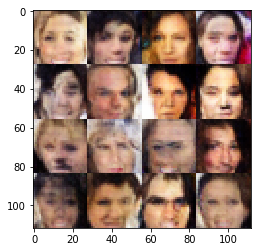

Epoch 3/5... Discriminator Loss: 1.3731... Generator Loss: 0.6737


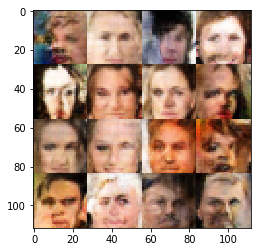

Epoch 3/5... Discriminator Loss: 1.6776... Generator Loss: 0.6255


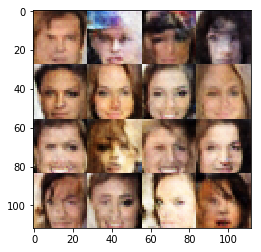

Epoch 3/5... Discriminator Loss: 1.6033... Generator Loss: 0.6151


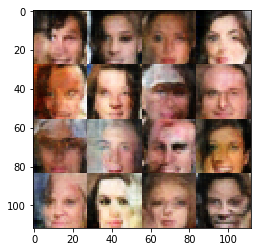

Epoch 3/5... Discriminator Loss: 1.5903... Generator Loss: 0.6029


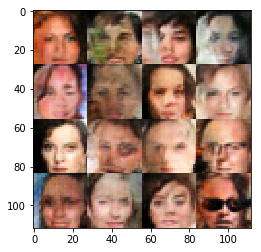

Epoch 3/5... Discriminator Loss: 1.5414... Generator Loss: 0.6620


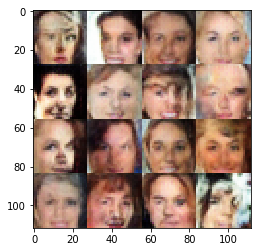

Epoch 3/5... Discriminator Loss: 1.6256... Generator Loss: 0.6332


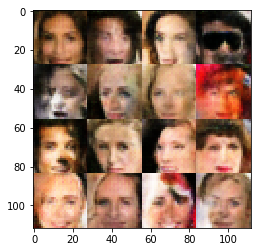

Epoch 3/5... Discriminator Loss: 1.9009... Generator Loss: 0.5730


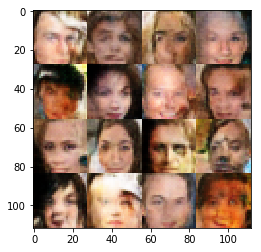

Epoch 3/5... Discriminator Loss: 1.7145... Generator Loss: 0.6350


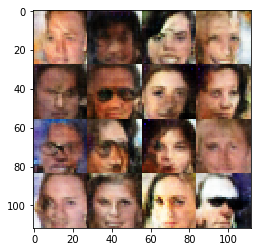

Epoch 3/5... Discriminator Loss: 1.4685... Generator Loss: 0.5539


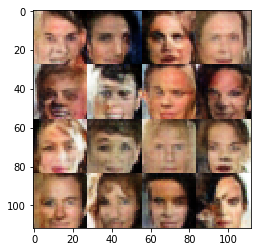

Epoch 3/5... Discriminator Loss: 1.4899... Generator Loss: 0.6598


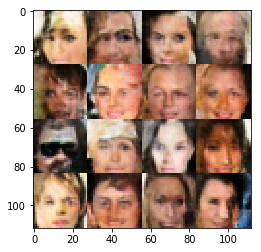

Epoch 3/5... Discriminator Loss: 1.6198... Generator Loss: 0.5878


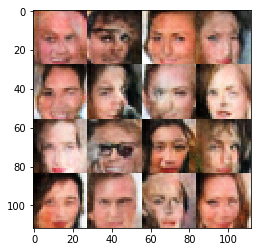

Epoch 3/5... Discriminator Loss: 1.5740... Generator Loss: 0.6196


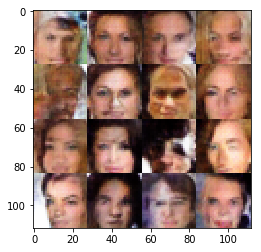

Epoch 3/5... Discriminator Loss: 1.6398... Generator Loss: 0.5613


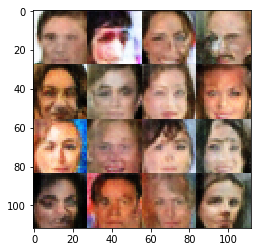

Epoch 3/5... Discriminator Loss: 1.5767... Generator Loss: 0.6117


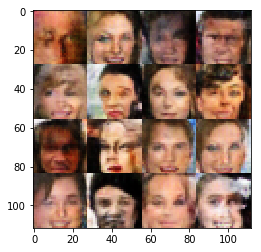

Epoch 3/5... Discriminator Loss: 1.6530... Generator Loss: 0.5834


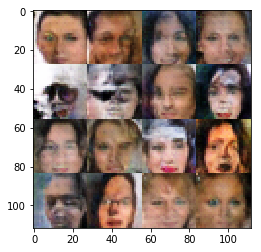

Epoch 3/5... Discriminator Loss: 1.6134... Generator Loss: 0.5844


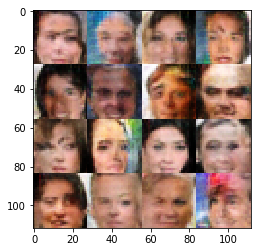

Epoch 3/5... Discriminator Loss: 1.6681... Generator Loss: 0.5840


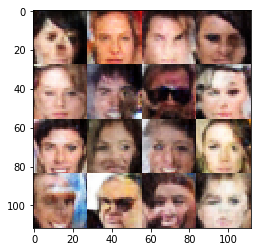

Epoch 3/5... Discriminator Loss: 1.5192... Generator Loss: 0.6268


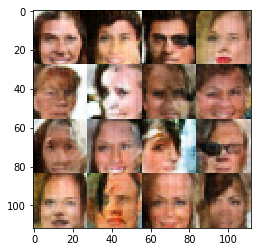

Epoch 3/5... Discriminator Loss: 1.5027... Generator Loss: 0.6004


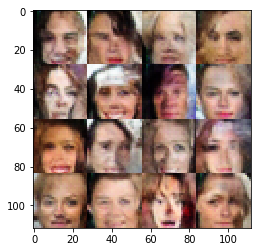

Epoch 3/5... Discriminator Loss: 1.5938... Generator Loss: 0.5176


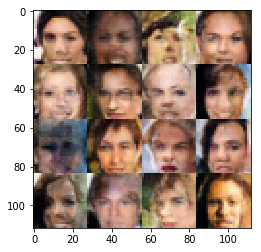

Epoch 3/5... Discriminator Loss: 1.7286... Generator Loss: 0.6097


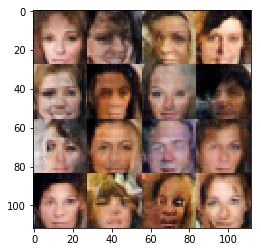

Epoch 3/5... Discriminator Loss: 1.7096... Generator Loss: 0.6570


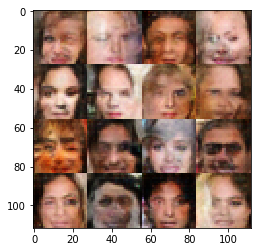

Epoch 3/5... Discriminator Loss: 1.8186... Generator Loss: 0.5438


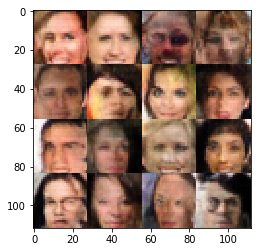

Epoch 3/5... Discriminator Loss: 1.6000... Generator Loss: 0.6321


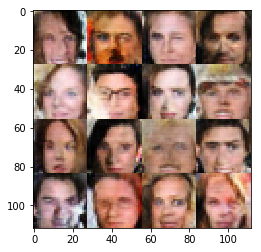

Epoch 3/5... Discriminator Loss: 1.5878... Generator Loss: 0.5822


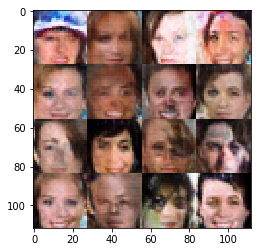

Epoch 3/5... Discriminator Loss: 1.5716... Generator Loss: 0.6471


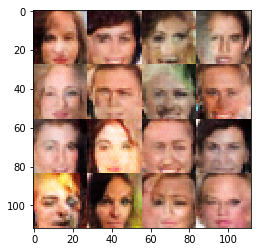

Epoch 3/5... Discriminator Loss: 1.7185... Generator Loss: 0.6510


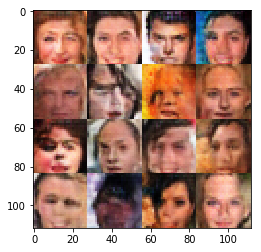

Epoch 3/5... Discriminator Loss: 1.6554... Generator Loss: 0.5818


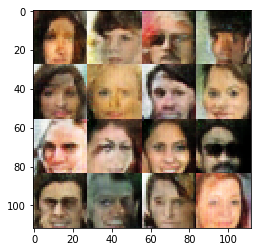

Epoch 4/5... Discriminator Loss: 1.6333... Generator Loss: 0.6295


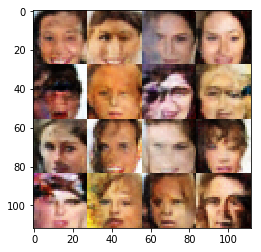

Epoch 4/5... Discriminator Loss: 1.6605... Generator Loss: 0.6474


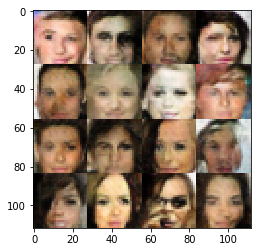

Epoch 4/5... Discriminator Loss: 1.5911... Generator Loss: 0.5503


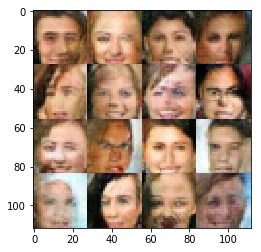

Epoch 4/5... Discriminator Loss: 1.7667... Generator Loss: 0.5602


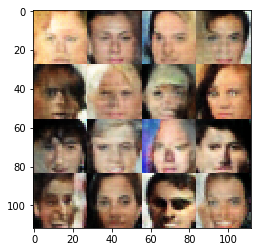

Epoch 4/5... Discriminator Loss: 1.7823... Generator Loss: 0.6247


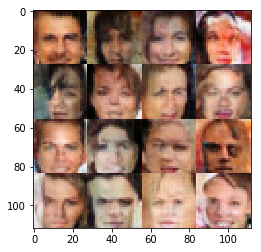

Epoch 4/5... Discriminator Loss: 1.4451... Generator Loss: 0.5896


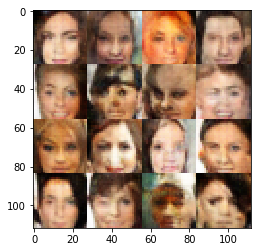

Epoch 4/5... Discriminator Loss: 1.6692... Generator Loss: 0.5896


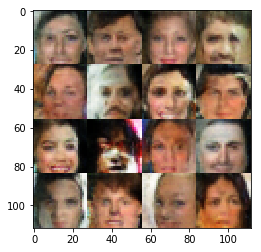

Epoch 4/5... Discriminator Loss: 1.6688... Generator Loss: 0.6280


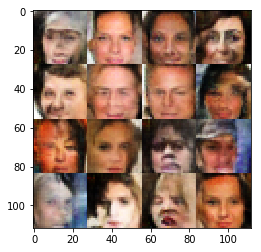

Epoch 4/5... Discriminator Loss: 1.5546... Generator Loss: 0.6294


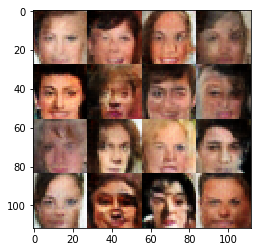

Epoch 4/5... Discriminator Loss: 1.6848... Generator Loss: 0.5698


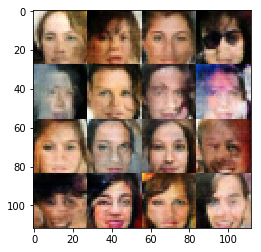

Epoch 4/5... Discriminator Loss: 1.5782... Generator Loss: 0.6236


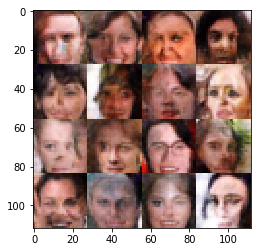

Epoch 4/5... Discriminator Loss: 1.5157... Generator Loss: 0.6153


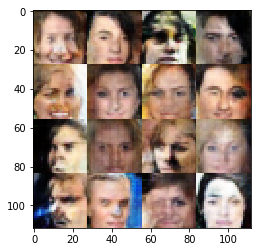

Epoch 4/5... Discriminator Loss: 1.6191... Generator Loss: 0.6096


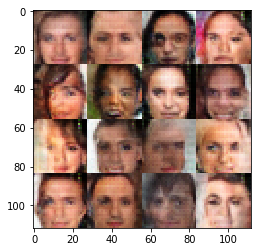

Epoch 4/5... Discriminator Loss: 1.6362... Generator Loss: 0.6617


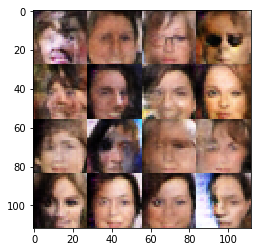

Epoch 4/5... Discriminator Loss: 1.7503... Generator Loss: 0.5718


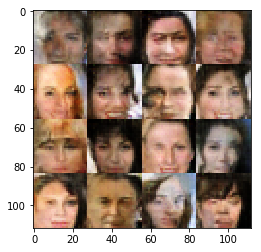

Epoch 4/5... Discriminator Loss: 1.9059... Generator Loss: 0.6157


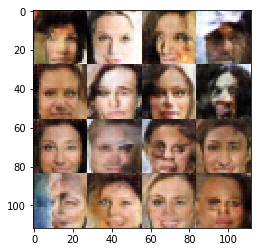

Epoch 4/5... Discriminator Loss: 1.4728... Generator Loss: 0.5376


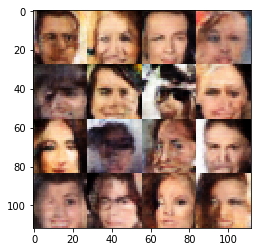

Epoch 4/5... Discriminator Loss: 1.4290... Generator Loss: 0.6780


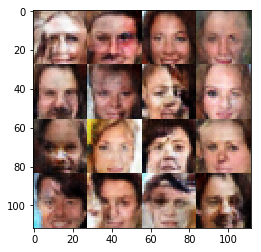

Epoch 4/5... Discriminator Loss: 1.7979... Generator Loss: 0.4800


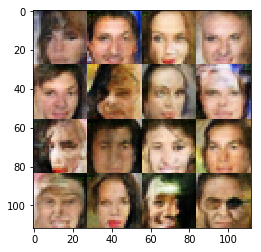

Epoch 4/5... Discriminator Loss: 1.4872... Generator Loss: 0.6624


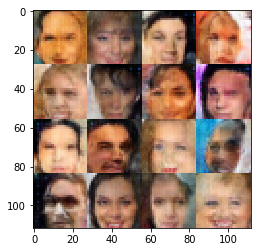

Epoch 4/5... Discriminator Loss: 1.6455... Generator Loss: 0.7195


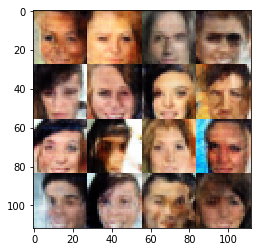

Epoch 4/5... Discriminator Loss: 1.6508... Generator Loss: 0.5862


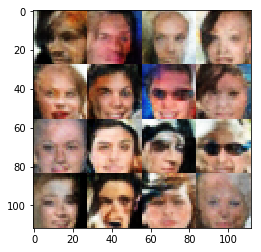

Epoch 4/5... Discriminator Loss: 1.5725... Generator Loss: 0.5975


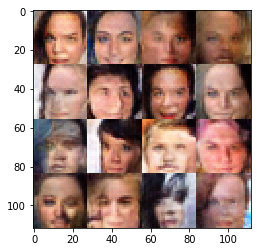

Epoch 4/5... Discriminator Loss: 1.6009... Generator Loss: 0.5122


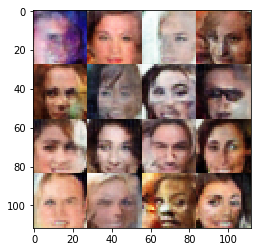

Epoch 4/5... Discriminator Loss: 1.5800... Generator Loss: 0.6048


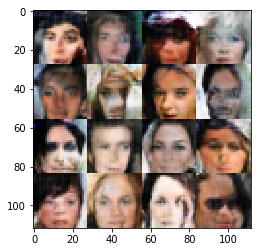

Epoch 4/5... Discriminator Loss: 1.6303... Generator Loss: 0.5641


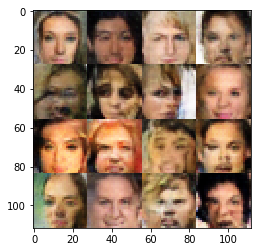

Epoch 4/5... Discriminator Loss: 1.5372... Generator Loss: 0.5596


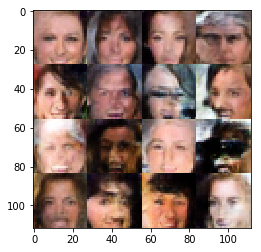

Epoch 4/5... Discriminator Loss: 1.4819... Generator Loss: 0.5940


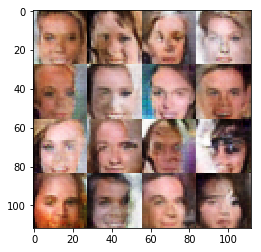

Epoch 4/5... Discriminator Loss: 1.6300... Generator Loss: 0.5371


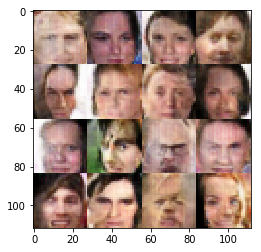

Epoch 4/5... Discriminator Loss: 1.6742... Generator Loss: 0.5983


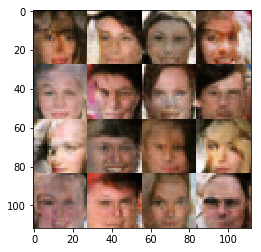

Epoch 4/5... Discriminator Loss: 1.7288... Generator Loss: 0.6757


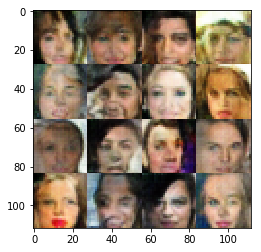

Epoch 4/5... Discriminator Loss: 1.5573... Generator Loss: 0.6634


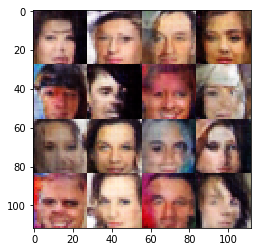

Epoch 4/5... Discriminator Loss: 1.6523... Generator Loss: 0.6357


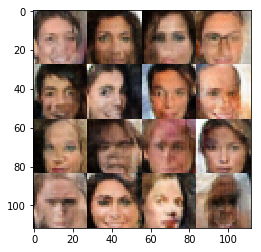

Epoch 4/5... Discriminator Loss: 1.6384... Generator Loss: 0.6084


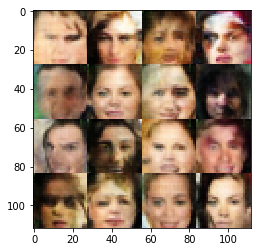

Epoch 4/5... Discriminator Loss: 1.5956... Generator Loss: 0.5541


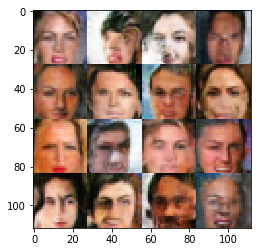

Epoch 4/5... Discriminator Loss: 1.5381... Generator Loss: 0.6233


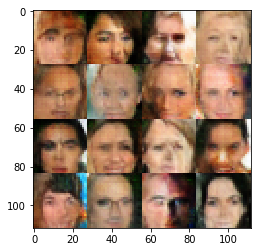

Epoch 4/5... Discriminator Loss: 1.5003... Generator Loss: 0.6285


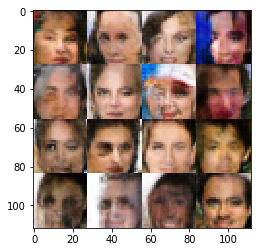

Epoch 4/5... Discriminator Loss: 1.7097... Generator Loss: 0.5608


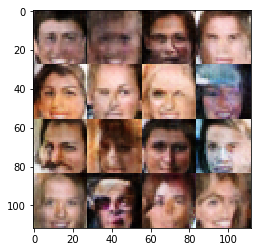

Epoch 4/5... Discriminator Loss: 1.5242... Generator Loss: 0.6731


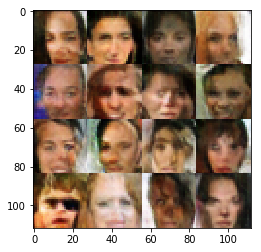

Epoch 4/5... Discriminator Loss: 1.5235... Generator Loss: 0.5967


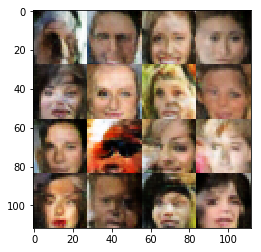

Epoch 4/5... Discriminator Loss: 1.7209... Generator Loss: 0.6504


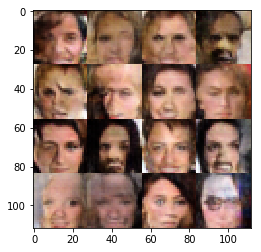

Epoch 4/5... Discriminator Loss: 1.6756... Generator Loss: 0.6530


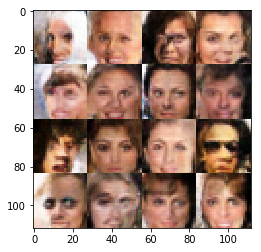

Epoch 4/5... Discriminator Loss: 1.6933... Generator Loss: 0.5942


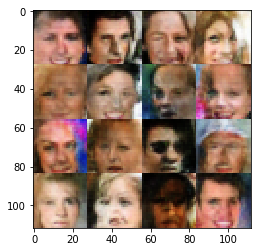

Epoch 4/5... Discriminator Loss: 1.6640... Generator Loss: 0.5674


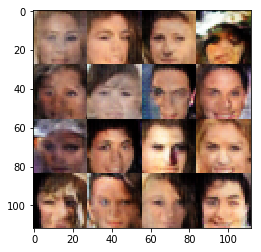

Epoch 4/5... Discriminator Loss: 1.6367... Generator Loss: 0.6061


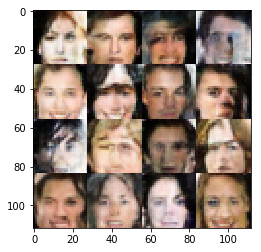

Epoch 4/5... Discriminator Loss: 1.6034... Generator Loss: 0.6535


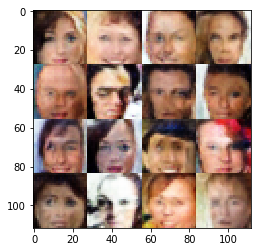

Epoch 4/5... Discriminator Loss: 1.6235... Generator Loss: 0.5520


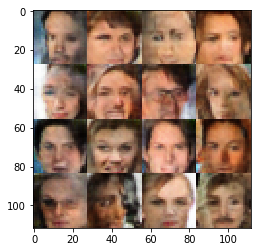

Epoch 4/5... Discriminator Loss: 1.4493... Generator Loss: 0.6220


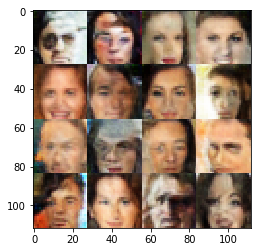

Epoch 4/5... Discriminator Loss: 1.5731... Generator Loss: 0.5604


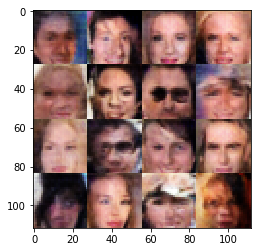

Epoch 4/5... Discriminator Loss: 1.4523... Generator Loss: 0.6037


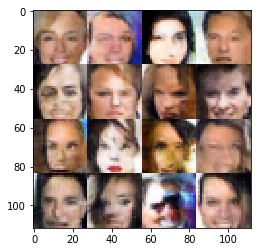

Epoch 4/5... Discriminator Loss: 1.5459... Generator Loss: 0.6439


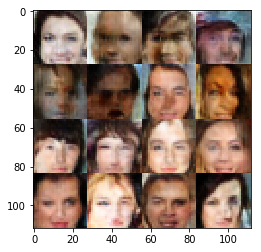

Epoch 4/5... Discriminator Loss: 1.6140... Generator Loss: 0.5318


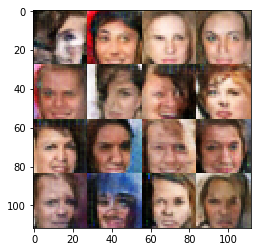

Epoch 4/5... Discriminator Loss: 1.4465... Generator Loss: 0.5976


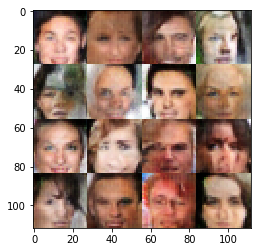

Epoch 4/5... Discriminator Loss: 1.5047... Generator Loss: 0.5692


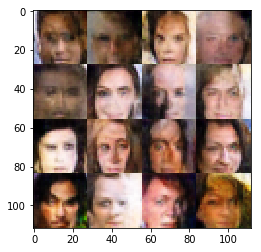

Epoch 4/5... Discriminator Loss: 1.6756... Generator Loss: 0.5792


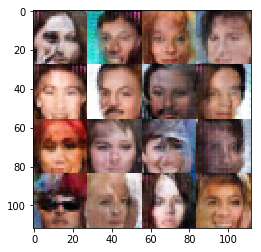

Epoch 4/5... Discriminator Loss: 1.5683... Generator Loss: 0.6559


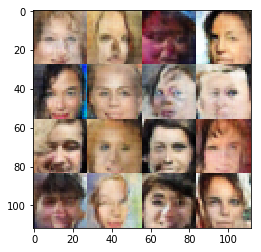

Epoch 4/5... Discriminator Loss: 1.5085... Generator Loss: 0.6790


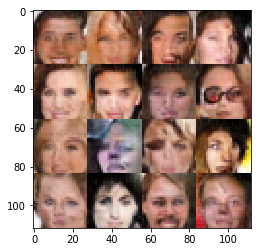

Epoch 4/5... Discriminator Loss: 1.5597... Generator Loss: 0.6424


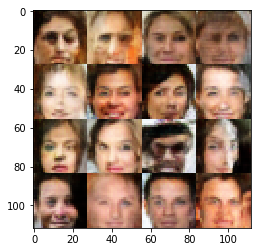

Epoch 4/5... Discriminator Loss: 1.6264... Generator Loss: 0.5332


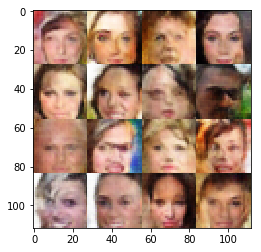

Epoch 4/5... Discriminator Loss: 1.6287... Generator Loss: 0.5542


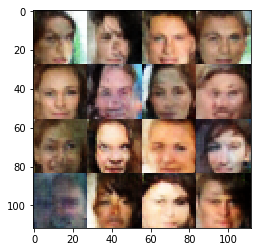

Epoch 4/5... Discriminator Loss: 1.7060... Generator Loss: 0.5507


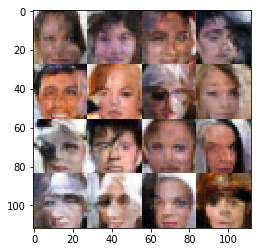

Epoch 4/5... Discriminator Loss: 1.6227... Generator Loss: 0.5654


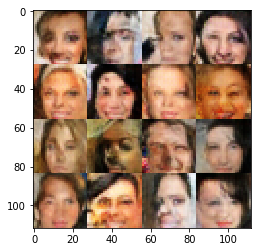

Epoch 4/5... Discriminator Loss: 1.8068... Generator Loss: 0.6031


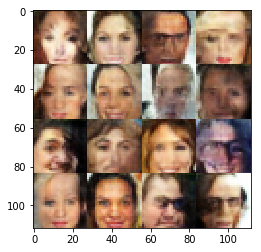

Epoch 4/5... Discriminator Loss: 1.5769... Generator Loss: 0.5475


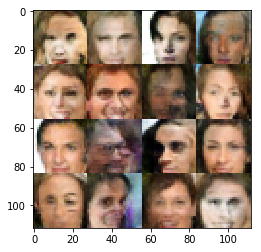

Epoch 5/5... Discriminator Loss: 1.5194... Generator Loss: 0.5866


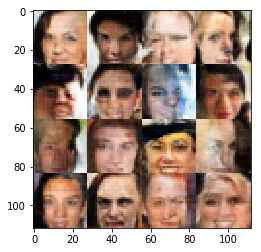

Epoch 5/5... Discriminator Loss: 1.6524... Generator Loss: 0.6108


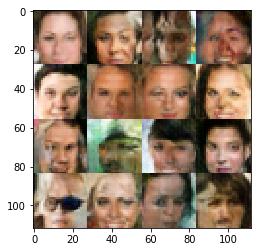

Epoch 5/5... Discriminator Loss: 1.4483... Generator Loss: 0.6166


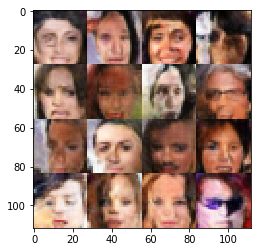

Epoch 5/5... Discriminator Loss: 1.6071... Generator Loss: 0.5926


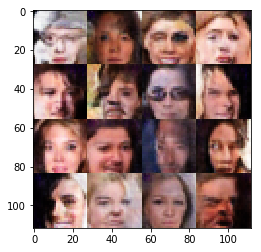

Epoch 5/5... Discriminator Loss: 1.5976... Generator Loss: 0.6526


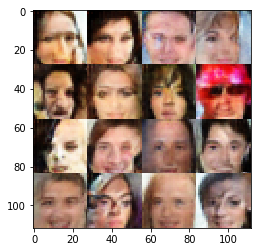

Epoch 5/5... Discriminator Loss: 1.5772... Generator Loss: 0.5829


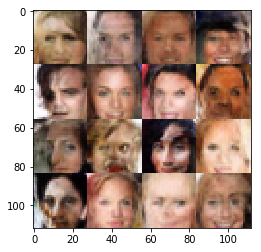

Epoch 5/5... Discriminator Loss: 1.4769... Generator Loss: 0.7003


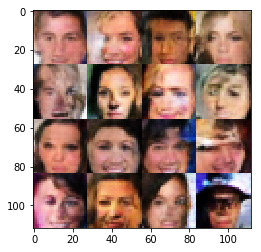

Epoch 5/5... Discriminator Loss: 1.5106... Generator Loss: 0.5425


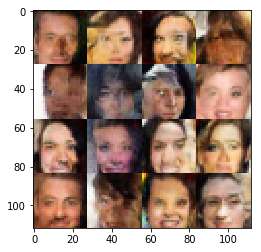

Epoch 5/5... Discriminator Loss: 1.5887... Generator Loss: 0.6091


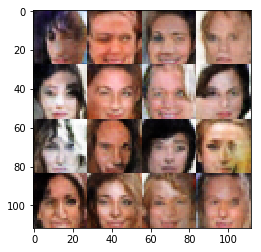

Epoch 5/5... Discriminator Loss: 1.4224... Generator Loss: 0.6120


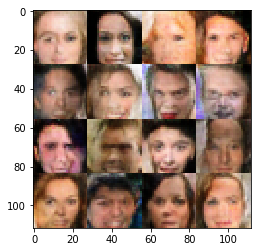

Epoch 5/5... Discriminator Loss: 1.5366... Generator Loss: 0.6657


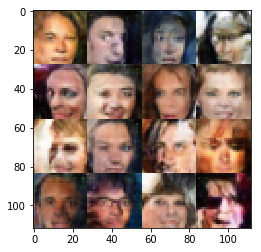

Epoch 5/5... Discriminator Loss: 1.6050... Generator Loss: 0.5604


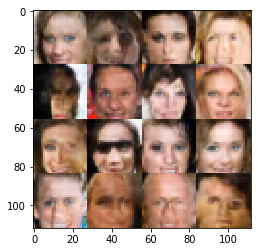

Epoch 5/5... Discriminator Loss: 1.4118... Generator Loss: 0.6433


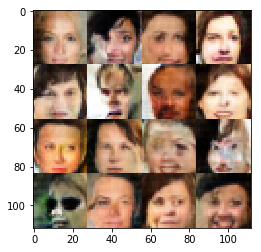

Epoch 5/5... Discriminator Loss: 1.6688... Generator Loss: 0.6438


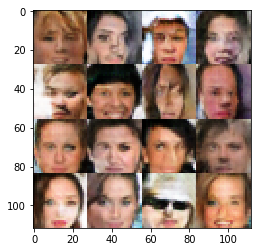

Epoch 5/5... Discriminator Loss: 1.5400... Generator Loss: 0.5921


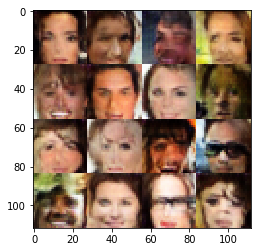

Epoch 5/5... Discriminator Loss: 1.4864... Generator Loss: 0.5784


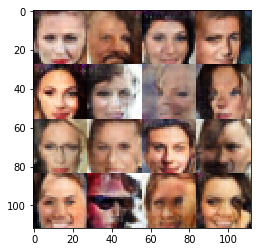

Epoch 5/5... Discriminator Loss: 1.4187... Generator Loss: 0.5684


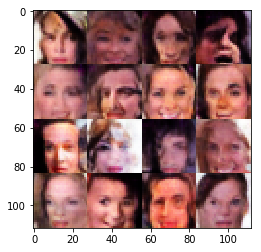

Epoch 5/5... Discriminator Loss: 1.6395... Generator Loss: 0.6111


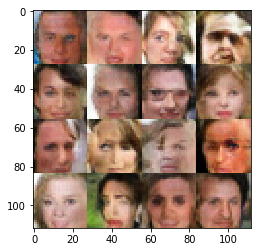

Epoch 5/5... Discriminator Loss: 1.3923... Generator Loss: 0.6881


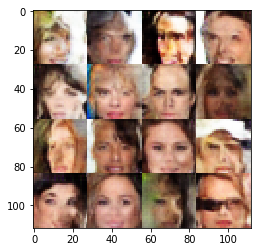

Epoch 5/5... Discriminator Loss: 1.3995... Generator Loss: 0.5660


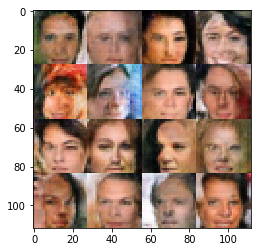

Epoch 5/5... Discriminator Loss: 1.5104... Generator Loss: 0.6100


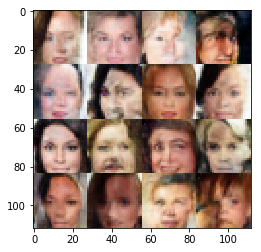

Epoch 5/5... Discriminator Loss: 1.5604... Generator Loss: 0.6582


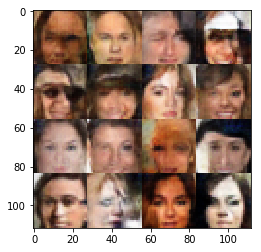

Epoch 5/5... Discriminator Loss: 1.6309... Generator Loss: 0.6329


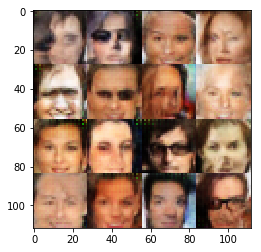

Epoch 5/5... Discriminator Loss: 1.4896... Generator Loss: 0.6582


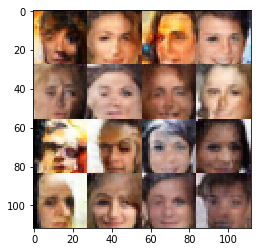

Epoch 5/5... Discriminator Loss: 1.5817... Generator Loss: 0.5797


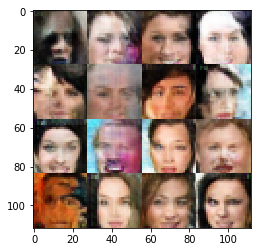

Epoch 5/5... Discriminator Loss: 1.5344... Generator Loss: 0.5614


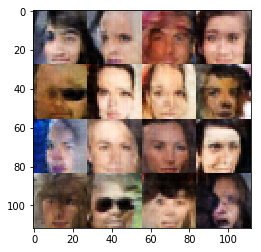

Epoch 5/5... Discriminator Loss: 1.5258... Generator Loss: 0.4948


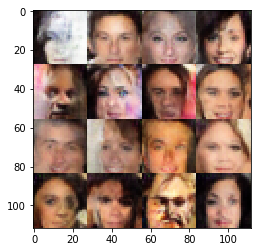

Epoch 5/5... Discriminator Loss: 1.4667... Generator Loss: 0.6663


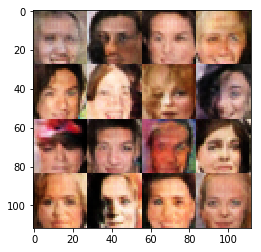

Epoch 5/5... Discriminator Loss: 1.5552... Generator Loss: 0.6370


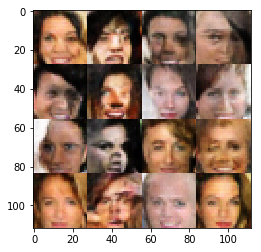

Epoch 5/5... Discriminator Loss: 1.4311... Generator Loss: 0.6120


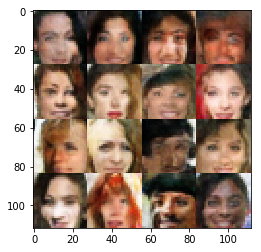

Epoch 5/5... Discriminator Loss: 1.5334... Generator Loss: 0.7201


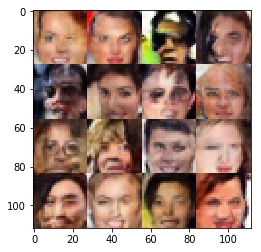

Epoch 5/5... Discriminator Loss: 1.4920... Generator Loss: 0.6515


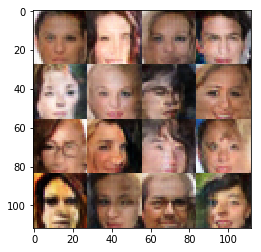

Epoch 5/5... Discriminator Loss: 1.5079... Generator Loss: 0.5893


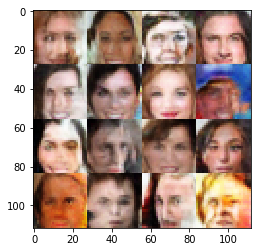

Epoch 5/5... Discriminator Loss: 1.5070... Generator Loss: 0.6510


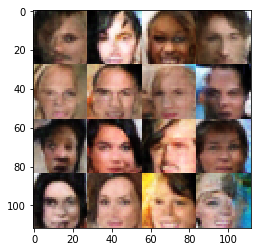

Epoch 5/5... Discriminator Loss: 1.5149... Generator Loss: 0.6256


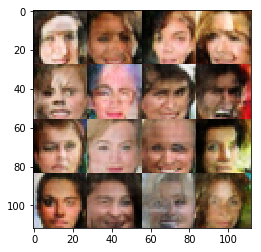

Epoch 5/5... Discriminator Loss: 1.5256... Generator Loss: 0.6360


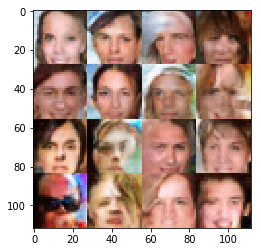

Epoch 5/5... Discriminator Loss: 1.6986... Generator Loss: 0.5820


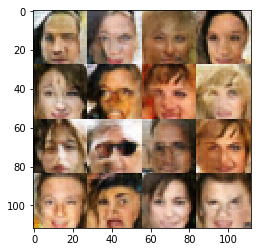

Epoch 5/5... Discriminator Loss: 1.5595... Generator Loss: 0.5758


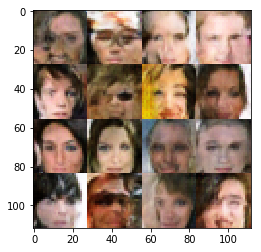

Epoch 5/5... Discriminator Loss: 1.6076... Generator Loss: 0.6435


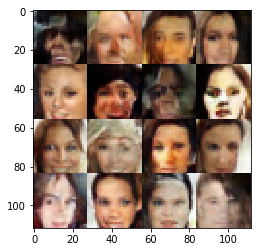

Epoch 5/5... Discriminator Loss: 1.5995... Generator Loss: 0.5780


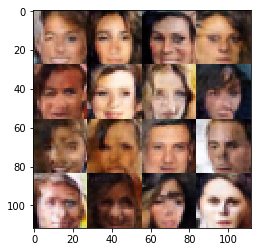

Epoch 5/5... Discriminator Loss: 1.4954... Generator Loss: 0.6531


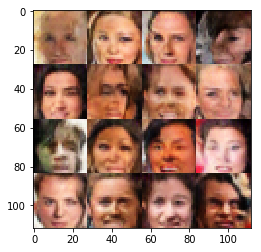

Epoch 5/5... Discriminator Loss: 1.5777... Generator Loss: 0.5807


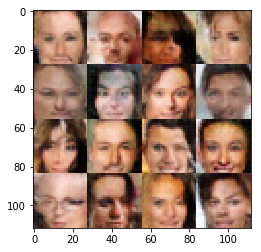

Epoch 5/5... Discriminator Loss: 1.6681... Generator Loss: 0.5389


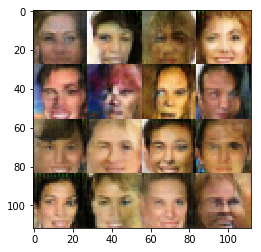

Epoch 5/5... Discriminator Loss: 1.7126... Generator Loss: 0.6747


In [ ]:
batch_size = 32
z_dim = 50
learning_rate = 0.001
beta1 = 0.1


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 5

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.